In [12]:
import pennylane as pl

In [16]:
from platform import python_version

print(python_version())

3.9.7


In [17]:
import numpy as np
from matplotlib import pyplot as plt
import os
from circuits_ttt import *
plt.rcParams.update({'font.size': 14})
from textwrap import wrap

In [18]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# l-p sweep

In [23]:
base_path = '/home/frarzani/Documents/Berlin/sides/pqc-symmetry/output/cluster_out/lp_sweep_y_redo/'

## Symmetric case

In [24]:
i = 0
lp_list = []
subplot_markers = {}
for marker in range(2000,2020):
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
        #print(params)
        args = params.split(" ")
        ind = (int(args[args.index('-re')+1]) , int((len(args[args.index('-l')+1])-1)/6))
        lp_list.append(ind)
        #print(args[args.index('-re')]+' '+args[args.index('-re')+1]+' layout: '+args[args.index('-l')+1]+' '+str(ind))
        subplot_markers[marker] = ind
        i+=1
print(lp_list)
print(subplot_markers)

[(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 1), (2, 2), (2, 3), (2, 4), (2, 5), (3, 1), (3, 2), (3, 3), (3, 4), (3, 5), (4, 1), (4, 2), (4, 3), (5, 1), (5, 2)]
{2000: (1, 1), 2001: (1, 2), 2002: (1, 3), 2003: (1, 4), 2004: (1, 5), 2005: (2, 1), 2006: (2, 2), 2007: (2, 3), 2008: (2, 4), 2009: (2, 5), 2010: (3, 1), 2011: (3, 2), 2012: (3, 3), 2013: (3, 4), 2014: (3, 5), 2015: (4, 1), 2016: (4, 2), 2017: (4, 3), 2018: (5, 1), 2019: (5, 2)}


no data for l,p = 3,5


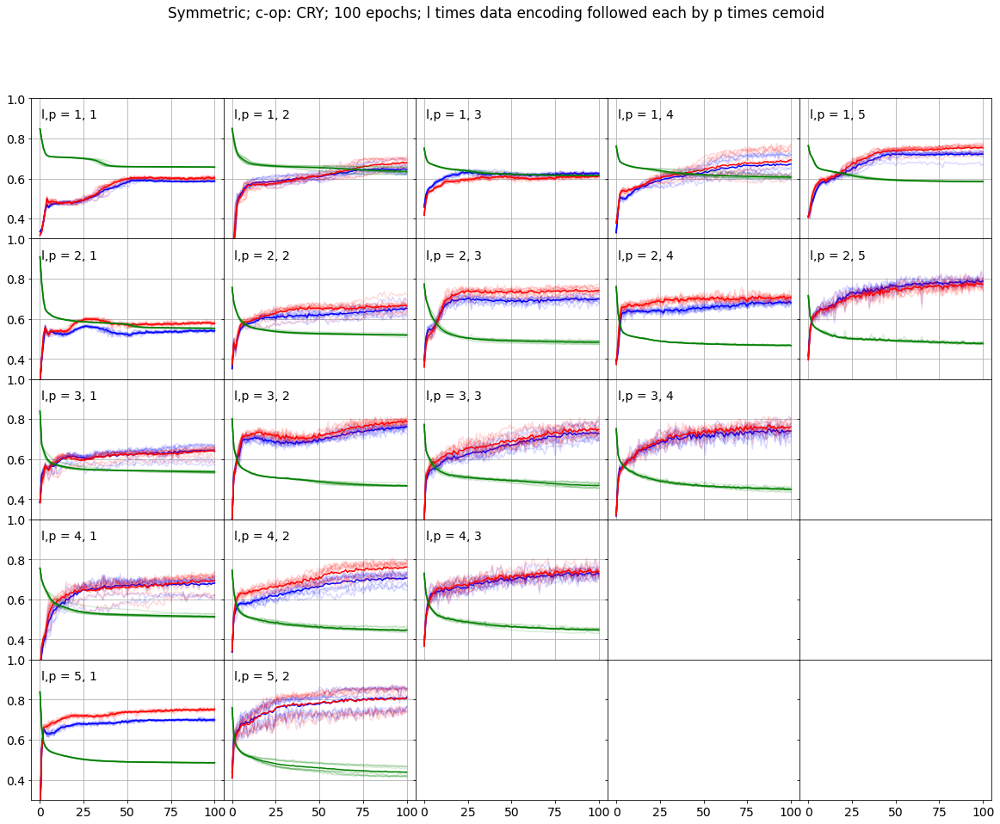

In [25]:
columns = 5
rows = 5
fig, ax_array = plt.subplots(rows, columns,squeeze=True, sharex='all', sharey='all', figsize=(20,15))
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)

fig.patch.set_facecolor('white')

for marker in range(2000,2020):
    
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    symmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
    
    args = params.split(" ")


    #ind = (int(args[args.index('-re')+1]) , int((len(args[args.index('-l')+1])-1)/6))

    x,y = subplot_markers[marker]
    
    
    #print(x,' ',y,' ', 'marker = ',marker)
    
    
    a = ax_array[x-1,y-1]
    
    
    
    if len(filenames)>1:
        a.text(1, 0.9, f'l,p = {x}, {y}')
        
        #epoch_acc = np.array([i['epoch total accuracy'][:100]  for i in symmetric])
        #epoch_train_acc = np.array([i['epoch accuracy'][:100]  for i in symmetric])
        #epoch_cost = (torch.tensor([i['epoch cost'][:100] for i in symmetric])).detach().numpy()
        epoch_acc = np.array([i['epoch total accuracy'] for i in symmetric])
        epoch_train_acc = np.array([i['epoch accuracy']  for i in symmetric])
        epoch_cost = (torch.tensor([i['epoch cost'] for i in symmetric])).detach().numpy()
        avg_epoch_acc = np.average(epoch_acc, axis=0)
        avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
        avg_epoch_cost = np.average(epoch_cost, axis=0)
        #plt.ylabel('accuracy')
    
    


        #a.xlabel('epoch')
        #print(len(filenames))
        a.plot([i.trace()/3 for i in avg_epoch_acc], label='Total accuracy',color='blue')
        for j in epoch_acc:
            a.plot([i.trace()/3 for i in j], color='blue',alpha=0.15)

        a.plot([i.trace()/3 for i in avg_epoch_train_acc], label='Training data accuracy',color='red')
        for j in epoch_train_acc:
            a.plot([i.trace()/3 for i in j], color='red',alpha=0.15)

        a.plot(avg_epoch_cost, label='cost function',color='green')
        for i in symmetric:
            a.plot((torch.tensor(i['epoch cost'])).detach().numpy(), color='green',alpha=0.15)

        #ax = plt.gca()
        a.set_ylim([0.3, 1])
        a.grid()
        #print('=================== done ================')
    else:
        print(f'no data for l,p = {x},{y}')
    

fig.suptitle('Symmetric; c-op: CRY; 100 epochs; l times data encoding followed each by p times cemoid')

plt.show()

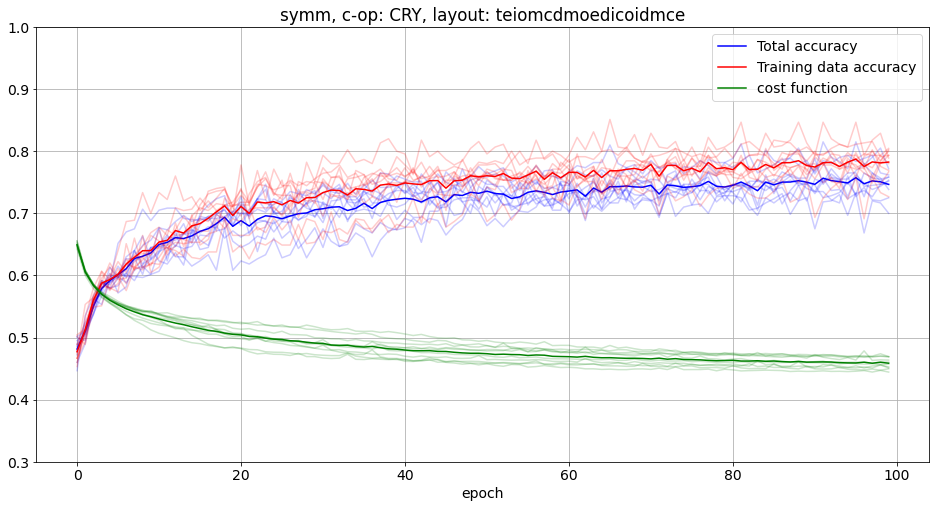

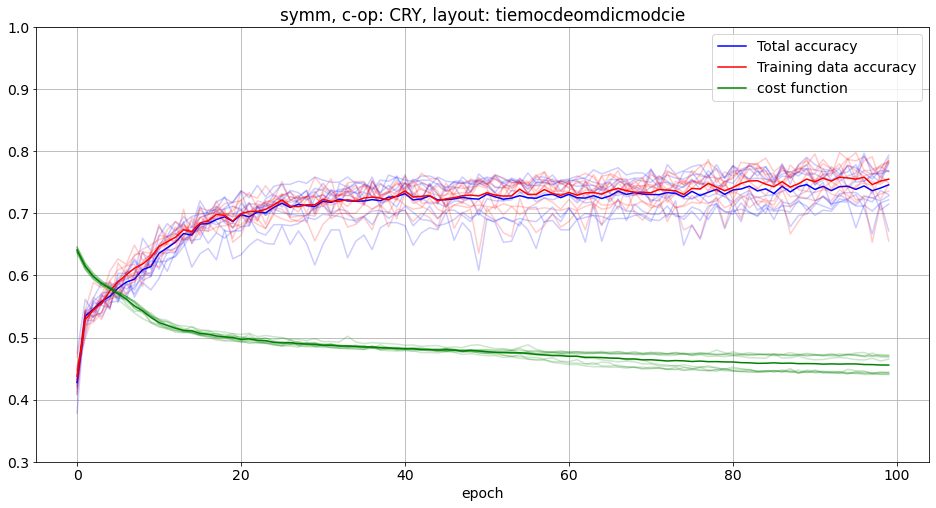

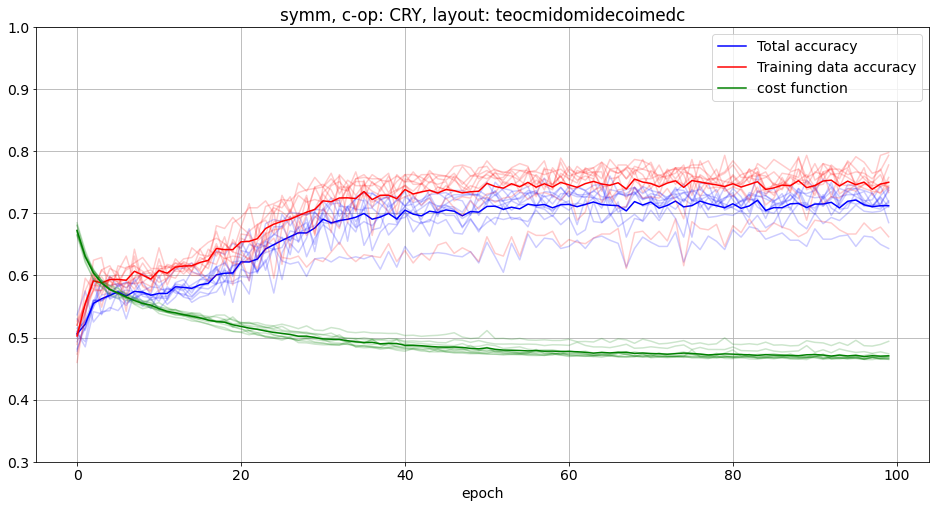

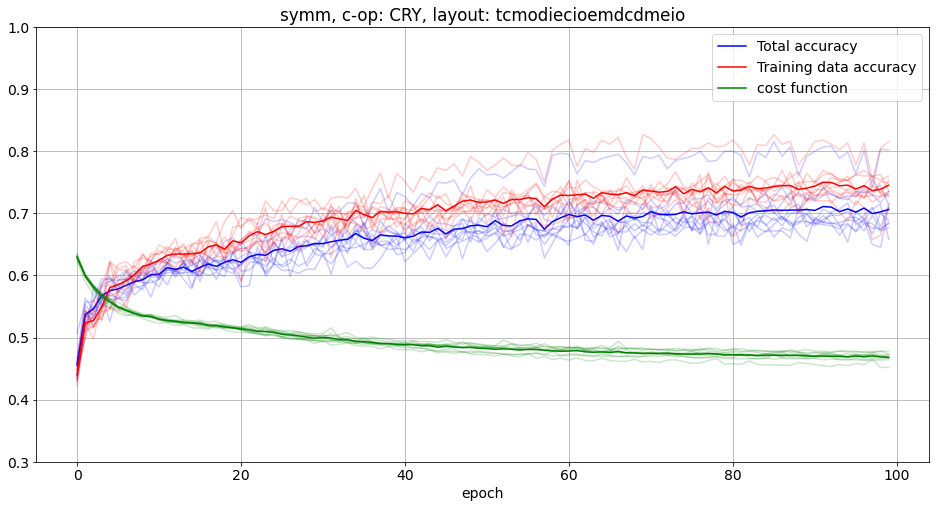

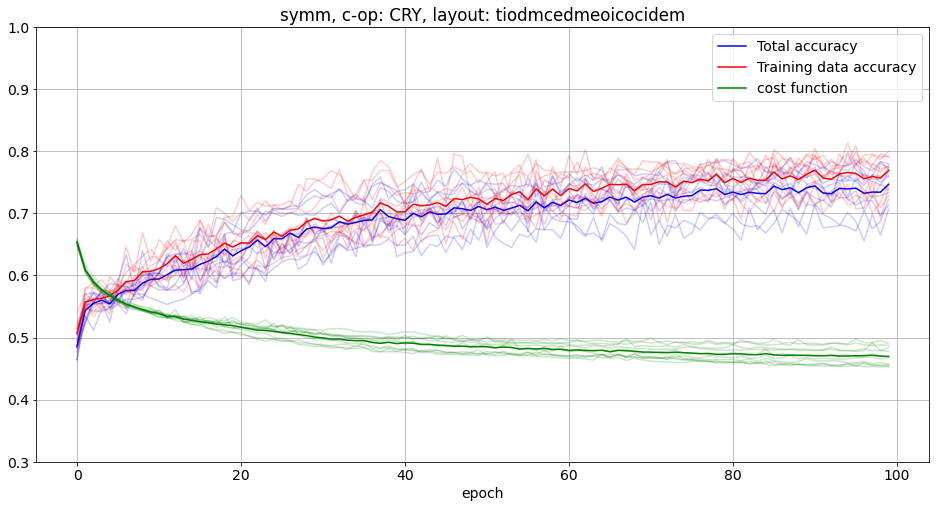

...

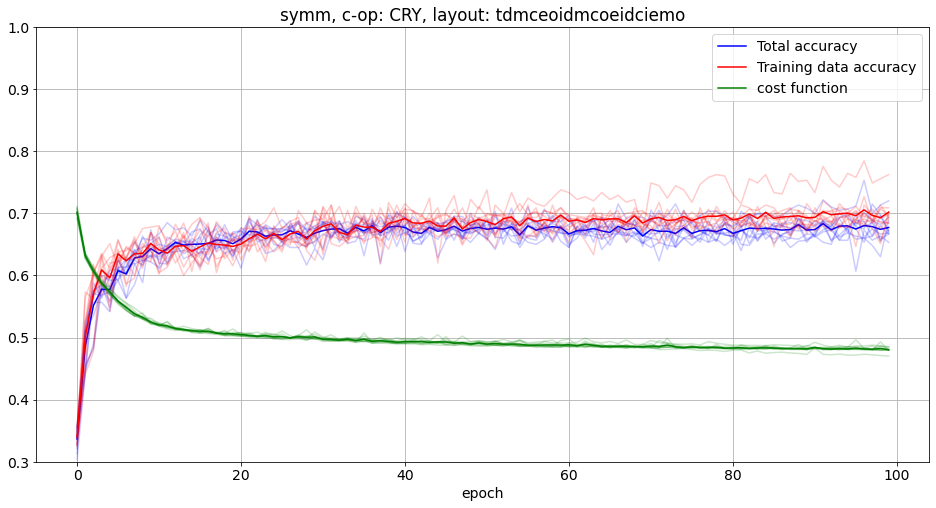

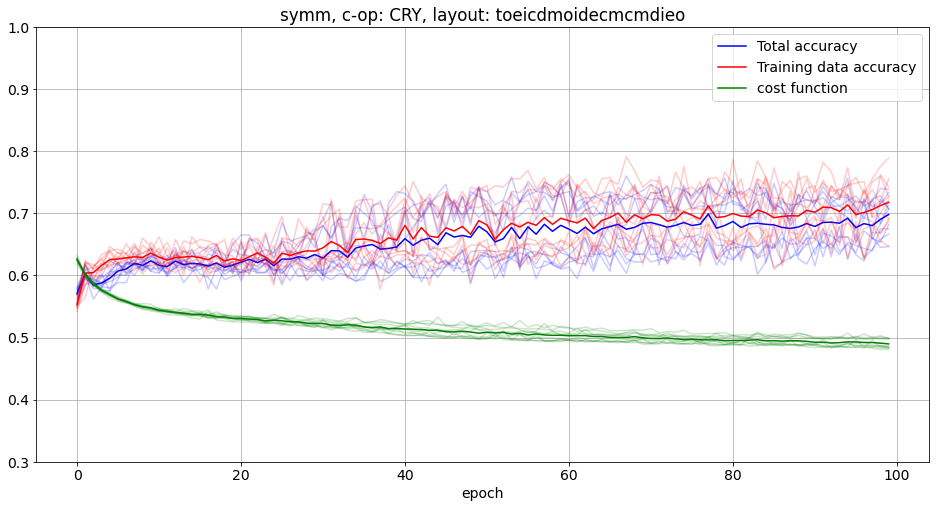

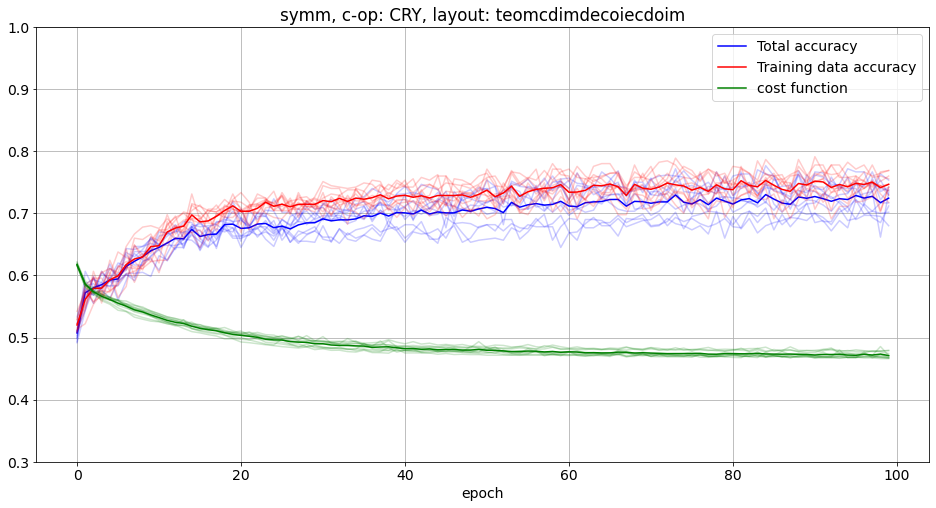

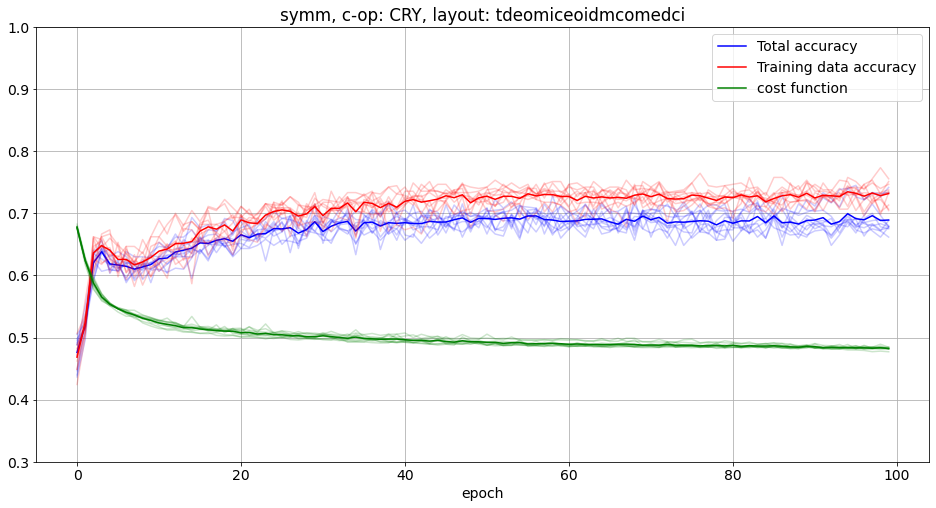

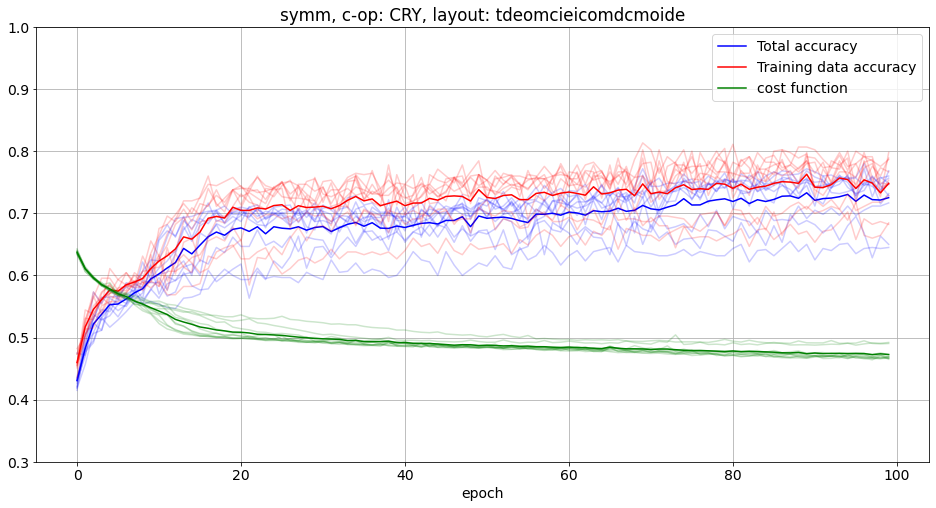

In [14]:
for marker in range(4000,4020):
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    symmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
    
    args = params.split(" ")
    
    
    plt.figure(figsize=(16, 8))

    
    epoch_acc = np.array([i['epoch total accuracy'] for i in symmetric])
    epoch_train_acc = np.array([i['epoch accuracy'] for i in symmetric])
    epoch_cost = (torch.tensor([i['epoch cost'] for i in symmetric])).detach().numpy()
    
    avg_epoch_acc = np.average(epoch_acc, axis=0)
    avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
    avg_epoch_cost = np.average(epoch_cost, axis=0)
    #plt.ylabel('accuracy')
    plt.xlabel('epoch')
    
    plt.plot([i.trace()/3 for i in avg_epoch_acc], label='Total accuracy',color='blue')
    for j in epoch_acc:
        plt.plot([i.trace()/3 for i in j], color='blue',alpha=0.2)
    
    plt.plot([i.trace()/3 for i in avg_epoch_train_acc], label='Training data accuracy',color='red')
    for j in epoch_train_acc:
        plt.plot([i.trace()/3 for i in j], color='red',alpha=0.2)
        
    plt.plot(avg_epoch_cost, label='cost function',color='green')
    for i in symmetric:
        plt.plot((torch.tensor(i['epoch cost'])).detach().numpy(), color='green',alpha=0.2)
    
    ax = plt.gca()
    ax.set_ylim([0.3, 1])
    
    #plt.title('symm\n'+params)
    plt.title('symm, c-op: CRY, layout: '+layout)
    plt.legend()
    plt.grid()
    plt.savefig(base_path+'/figs/symm_'+str(marker))
    

## Non symmetric case

In [13]:
i = 0
lp_list = []
subplot_markers = {}
for marker in range(3000,3020):
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
        #print(params)
        args = params.split(" ")
        ind = (int(args[args.index('-re')+1]) , int((len(args[args.index('-l')+1])-1)/6))
        lp_list.append(ind)
        #print(args[args.index('-re')]+' '+args[args.index('-re')+1]+' layout: '+args[args.index('-l')+1]+' '+str(ind))
        subplot_markers[marker] = ind
        i+=1
print(lp_list)
print(subplot_markers)

[(1, 1), (1, 2), (1, 3), (1, 4), (1, 5), (2, 1), (2, 2), (2, 3), (2, 4), (2, 5), (3, 1), (3, 2), (3, 3), (3, 4), (3, 5), (4, 1), (4, 2), (4, 3), (5, 1), (5, 2)]
{3000: (1, 1), 3001: (1, 2), 3002: (1, 3), 3003: (1, 4), 3004: (1, 5), 3005: (2, 1), 3006: (2, 2), 3007: (2, 3), 3008: (2, 4), 3009: (2, 5), 3010: (3, 1), 3011: (3, 2), 3012: (3, 3), 3013: (3, 4), 3014: (3, 5), 3015: (4, 1), 3016: (4, 2), 3017: (4, 3), 3018: (5, 1), 3019: (5, 2)}


no data for l,p = 3,5
no data for l,p = 4,3
no data for l,p = 5,2


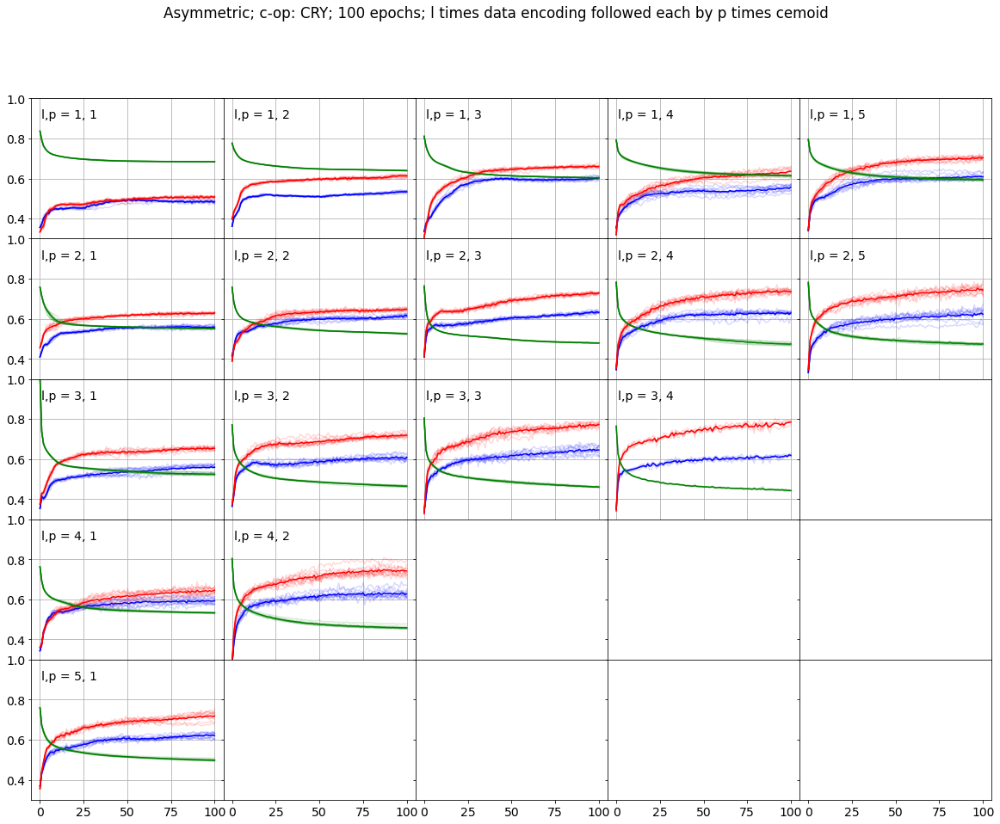

In [14]:
columns = 5
rows = 5
fig, ax_array = plt.subplots(rows, columns,squeeze=True, sharex='all', sharey='all', figsize=(20,15))
fig.subplots_adjust(hspace=0)
fig.subplots_adjust(wspace=0)

fig.patch.set_facecolor('white')

for marker in range(3000,3020):
    
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    asymmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
    
    args = params.split(" ")


    #ind = (int(args[args.index('-re')+1]) , int((len(args[args.index('-l')+1])-1)/6))

    x,y = subplot_markers[marker]
    
    
    #print(x,' ',y,' ', 'marker = ',marker)
    
    
    a = ax_array[x-1,y-1]
    
    
    
    if len(filenames)>1:
        a.text(1, 0.9, f'l,p = {x}, {y}')
        
        #epoch_acc = np.array([i['epoch total accuracy'][:100]  for i in asymmetric])
        #epoch_train_acc = np.array([i['epoch accuracy'][:100]  for i in asymmetric])
        #epoch_cost = (torch.tensor([i['epoch cost'][:100] for i in asymmetric])).detach().numpy()
        
        epoch_acc = np.array([i['epoch total accuracy']  for i in asymmetric])
        epoch_train_acc = np.array([i['epoch accuracy']  for i in asymmetric])
        epoch_cost = (torch.tensor([i['epoch cost'] for i in asymmetric])).detach().numpy()
        
        #print(f'shape of epoch_cost: {epoch_cost.shape}')
        
        
        avg_epoch_acc = np.average(epoch_acc, axis=0)
        avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
        avg_epoch_cost = np.mean(epoch_cost, axis=0)
        
        #avg_epoch_cost = 0.1*np.sum(epoch_cost, axis=0)
        
        #plt.ylabel('accuracy')
    
    


        #a.xlabel('epoch')
        #print(len(filenames))
        a.plot([i.trace()/3 for i in avg_epoch_acc], label='Total accuracy',color='blue')
        for j in epoch_acc:
            a.plot([i.trace()/3 for i in j], color='blue',alpha=0.15)

        a.plot([i.trace()/3 for i in avg_epoch_train_acc], label='Training data accuracy',color='red')
        for j in epoch_train_acc:
            a.plot([i.trace()/3 for i in j], color='red',alpha=0.15)

        a.plot(avg_epoch_cost, label='cost function',color='green')
        for i in asymmetric:
            a.plot((torch.tensor(i['epoch cost'])).detach().numpy(), color='green',alpha=0.15)

        #ax = plt.gca()
        a.set_ylim([0.3, 1])
        a.grid()
        #print('=================== done ================')
    else:
        print(f'no data for l,p = {x},{y}')
    

fig.suptitle('Asymmetric; c-op: CRY; 100 epochs; l times data encoding followed each by p times cemoid')

plt.show()

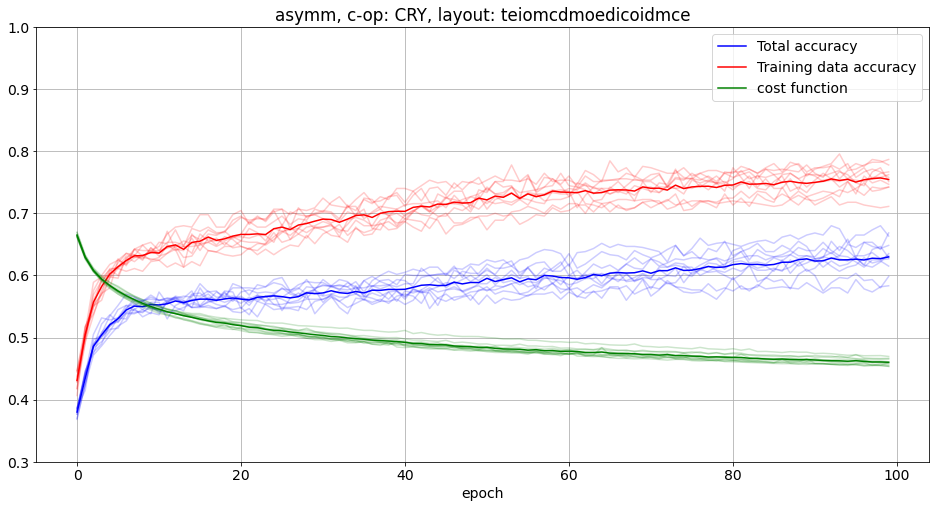

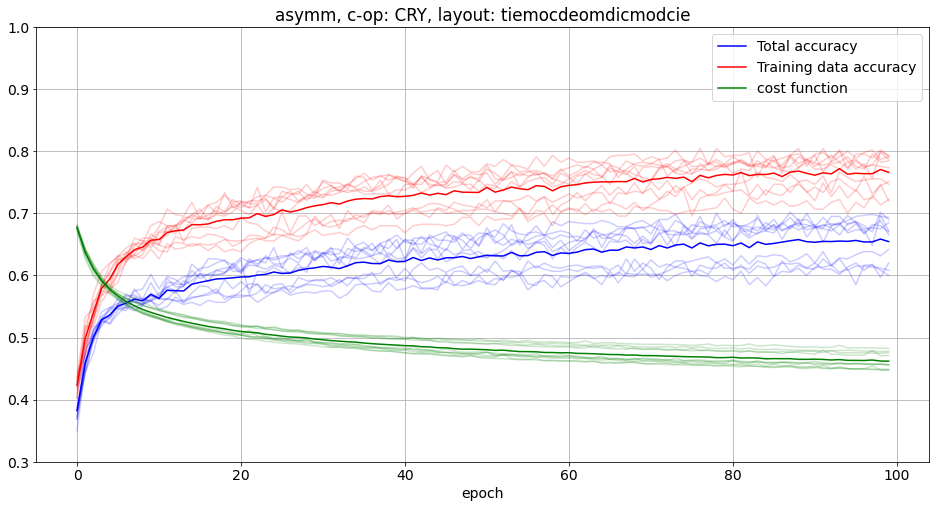

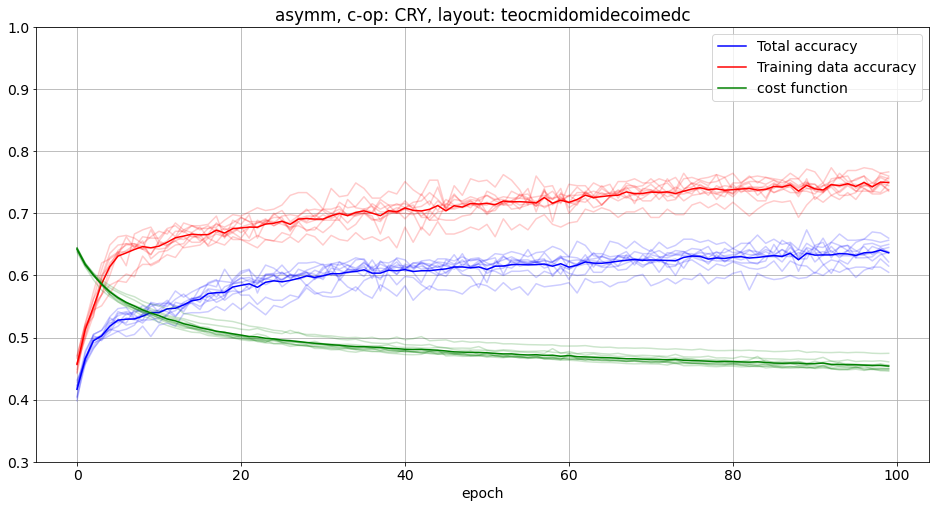

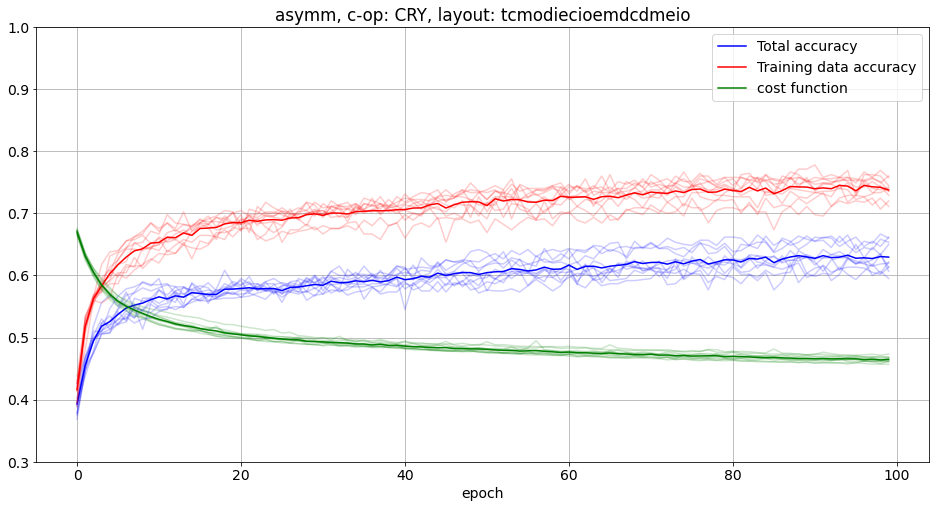

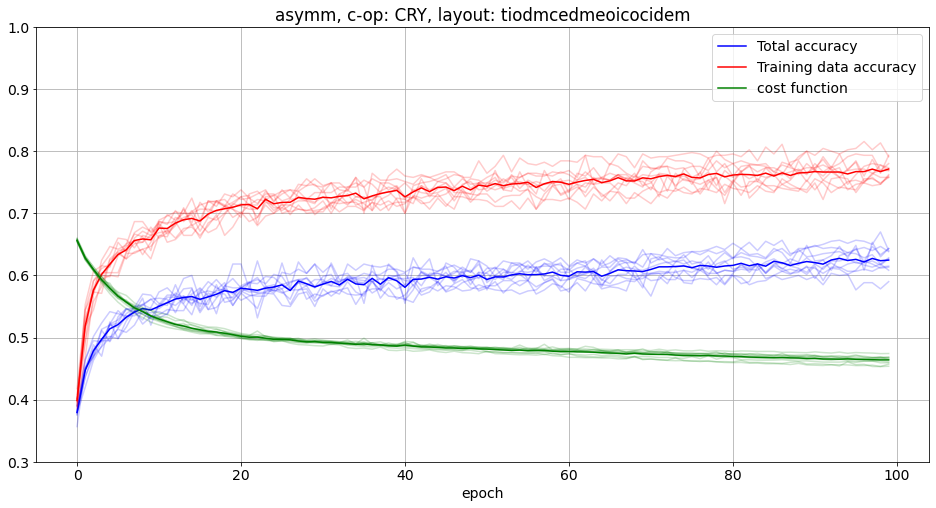

...

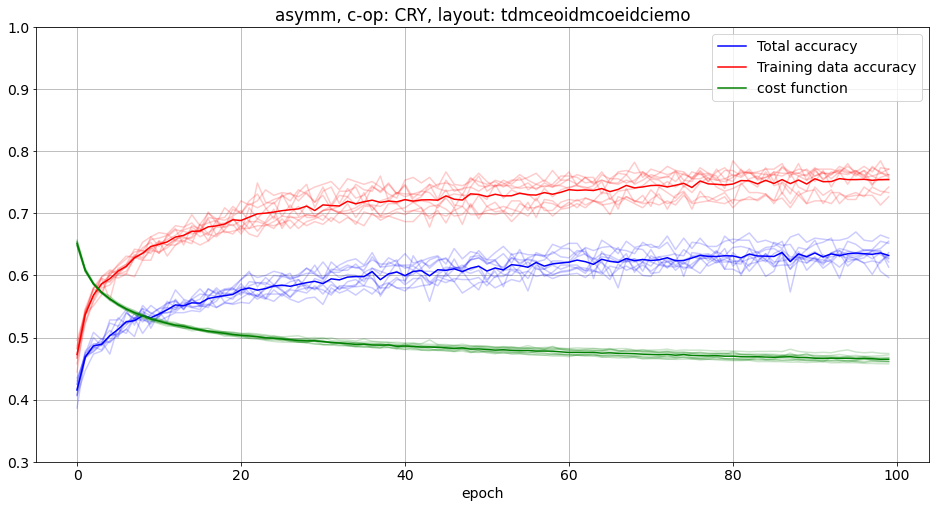

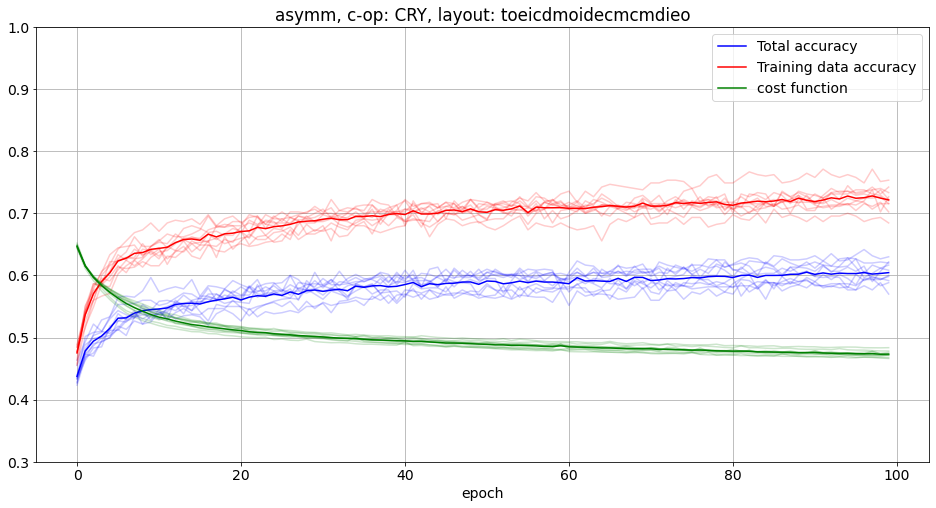

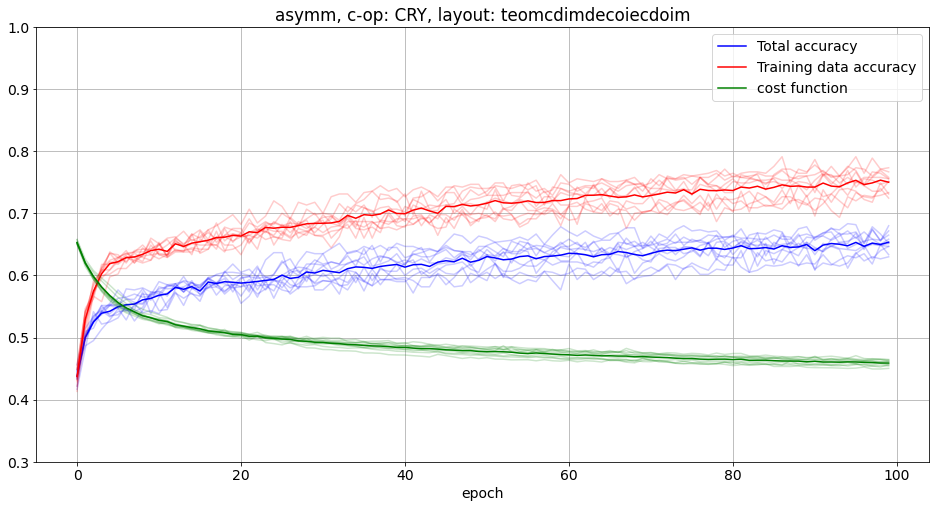

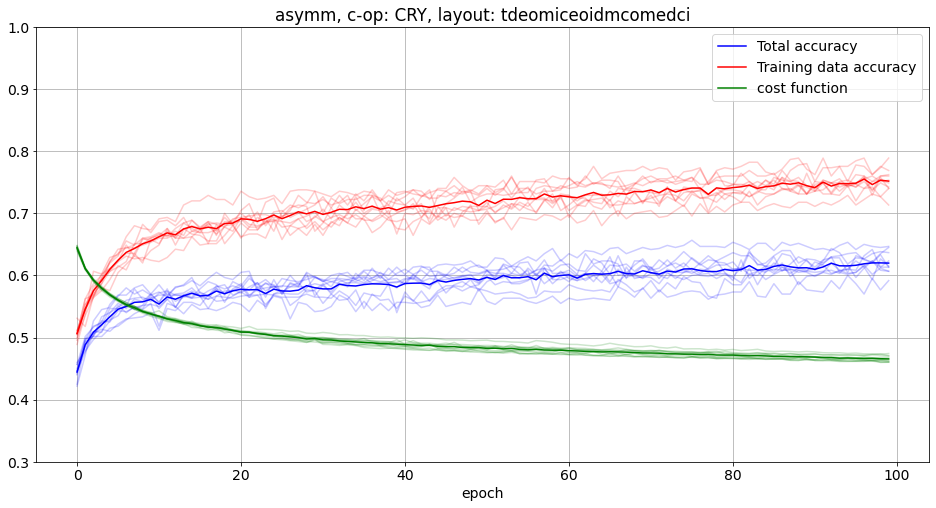

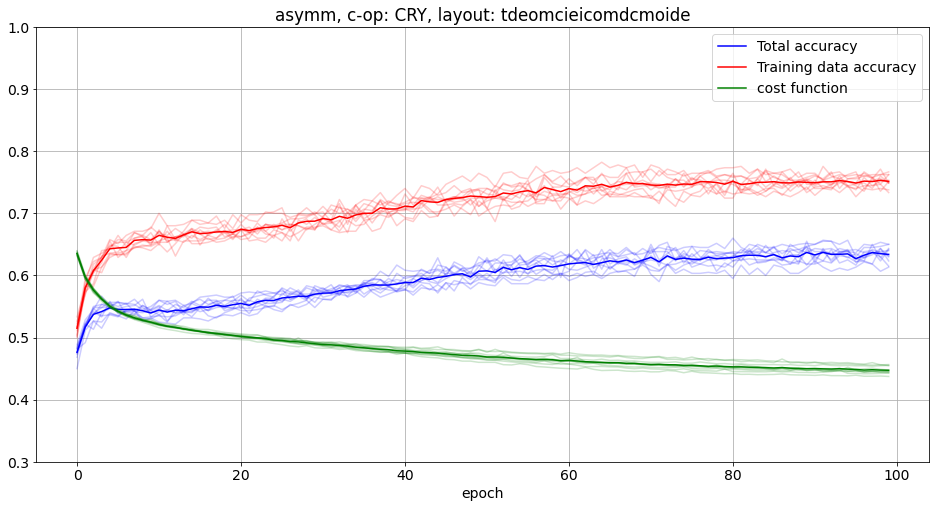

In [15]:
for marker in range(5000,5020):
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    asymmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    #filenames = next(os.walk(path_to_analyze), (None, None, []))[2]
    #symmetric = [np.load(path_to_analyze + '/' + i, allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
    
    args = params.split(" ")
    layout = args[args.index('-l')+1]
    
    plt.figure(figsize=(16, 8))

    epoch_acc = np.array([i['epoch total accuracy'] for i in asymmetric])
    epoch_train_acc = np.array([i['epoch accuracy'] for i in asymmetric])
    epoch_cost = (torch.tensor([i['epoch cost'] for i in asymmetric])).detach().numpy()
    
    avg_epoch_acc = np.average(epoch_acc, axis=0)
    avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
    avg_epoch_cost = np.average(epoch_cost, axis=0)
    #plt.ylabel('accuracy')
    plt.xlabel('epoch')
    
    plt.plot([i.trace()/3 for i in avg_epoch_acc], label='Total accuracy',color='blue')
    for j in epoch_acc:
        plt.plot([i.trace()/3 for i in j], color='blue',alpha=0.2)
    
    plt.plot([i.trace()/3 for i in avg_epoch_train_acc], label='Training data accuracy',color='red')
    for j in epoch_train_acc:
        plt.plot([i.trace()/3 for i in j], color='red',alpha=0.2)
        
    plt.plot(avg_epoch_cost, label='cost function',color='green')
    for j in epoch_cost:
        plt.plot(j[:], color='green',alpha=0.2)
        #plt.plot((torch.tensor(i['epoch cost'])).detach().numpy(), color='green',alpha=0.2)
    
    ax = plt.gca()
    ax.set_ylim([0.3, 1])
    
    #plt.title('symm\n'+params)
    plt.title('asymm, c-op: CRY, layout: '+layout)
    plt.legend()
    plt.grid()
    plt.savefig(base_path+'/figs/asymm_'+str(marker))
    

In [87]:
epoch_cost[:,:10]

array([[0.76694435, 0.6663175 , 0.6198886 , 0.5904743 , 0.5701682 ,
        0.55433863, 0.54451764, 0.53683466, 0.53020704, 0.5262995 ],
       [0.7669443 , 0.66414994, 0.61896104, 0.5880841 , 0.57121176,
        0.55847746, 0.54906243, 0.5410328 , 0.53490454, 0.530677  ],
       [0.76694435, 0.6600125 , 0.6138301 , 0.5844903 , 0.56689143,
        0.5545946 , 0.5439327 , 0.5369736 , 0.5306184 , 0.5255881 ],
       [0.76694435, 0.65954596, 0.61035645, 0.5834593 , 0.56628734,
        0.5537497 , 0.54572433, 0.5360496 , 0.5305928 , 0.5273357 ],
       [0.7669443 , 0.6610854 , 0.60948527, 0.5841036 , 0.5685905 ,
        0.5567543 , 0.54758584, 0.5395418 , 0.533683  , 0.52675766],
       [0.7669443 , 0.6603797 , 0.6113957 , 0.58478475, 0.56753546,
        0.55569535, 0.54711807, 0.54014224, 0.53349113, 0.5289233 ],
       [0.76694435, 0.6644628 , 0.6168047 , 0.58659065, 0.5680528 ,
        0.5561631 , 0.54657763, 0.5374747 , 0.53190064, 0.52703696],
       [0.76694435, 0.66306883, 0.6176826

# Random layouts

In [26]:
base_path = '/home/frarzani/Documents/Berlin/sides/pqc-symmetry/output/cluster_out/rand_layout_y/'

## Symmetric case

In [27]:
i = 0
for marker in range(4000,4020):
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
        args = params.split(" ")
        print(str(i)+' '+args[args.index('-l')+1])
        i+=1

0 teiomcdmoedicoidmce
1 tiemocdeomdicmodcie
2 teocmidomidecoimedc
3 tcmodiecioemdcdmeio
4 tiodmcedmeoicocidem
5 tecmodidecmioidcmeo
6 tecmidodeicomimdeco
7 temcoidceidomocedmi
8 teimdcocodeimcoemdi
9 teiodmcieomcdoeidmc
10 tedoicmecdiomioecdm
11 tcdeomideoimcmdcioe
12 tdoemcimcdoeiceoidm
13 tecimdoicoemdioedcm
14 tdcmoeicmodieoeicdm
15 tdmceoidmcoeidciemo
16 toeicdmoidecmcmdieo
17 teomcdimdecoiecdoim
18 tdeomiceoidmcomedci
19 tdeomcieicomdcmoide


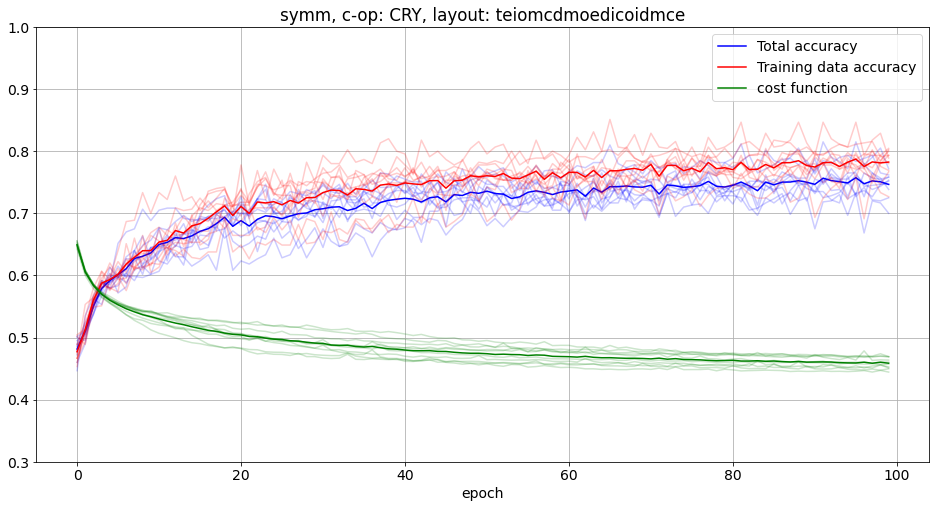

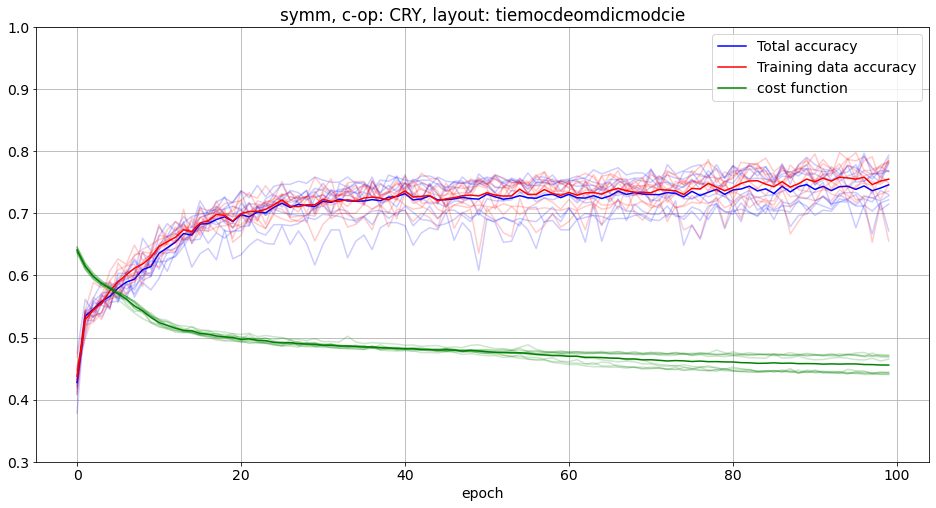

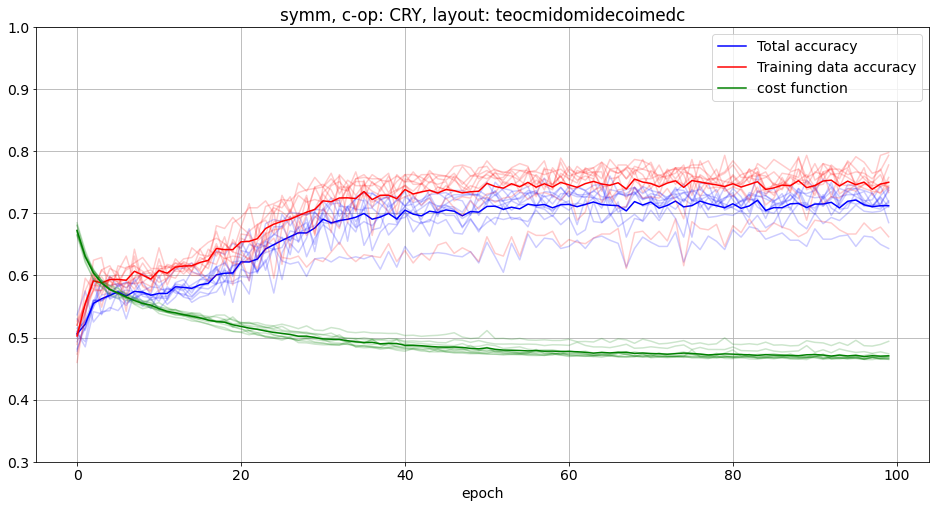

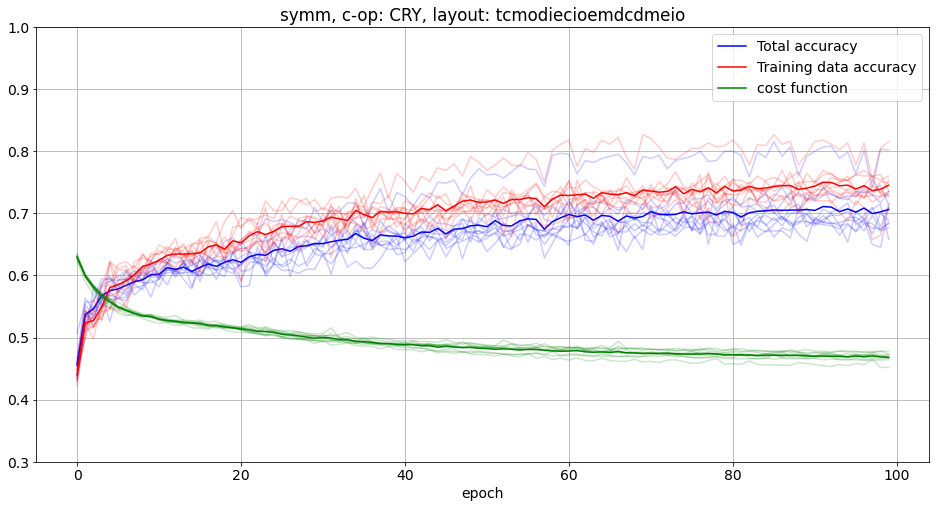

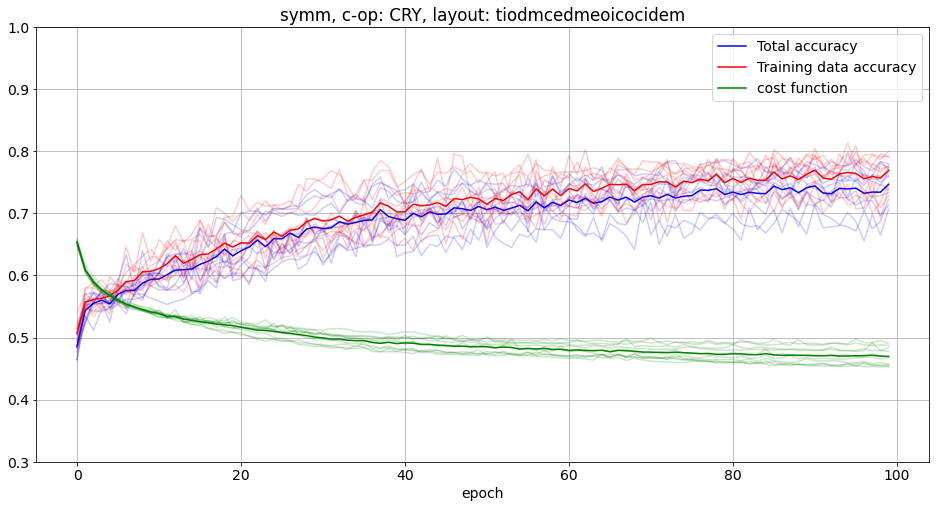

...

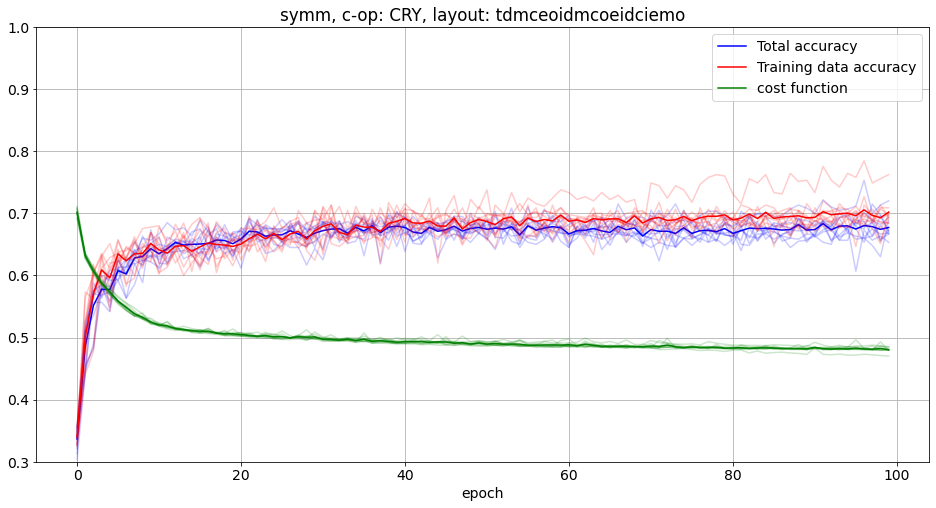

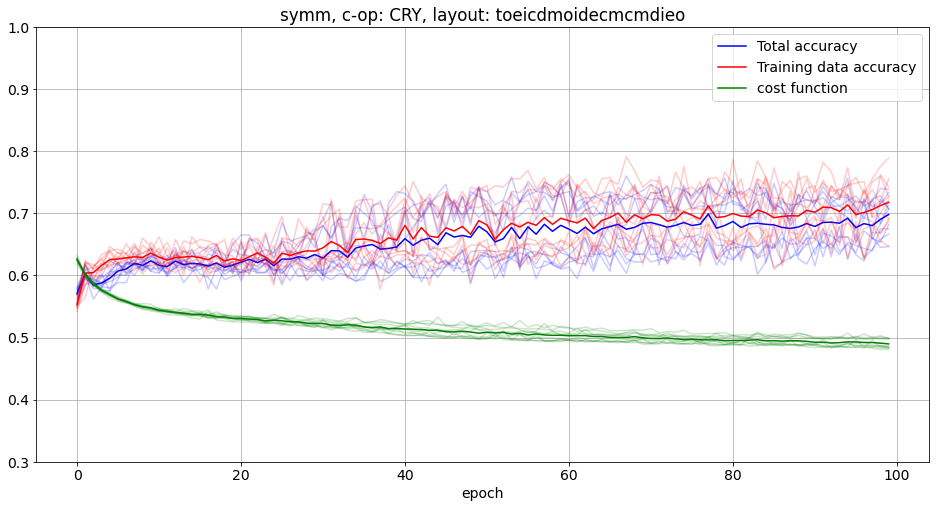

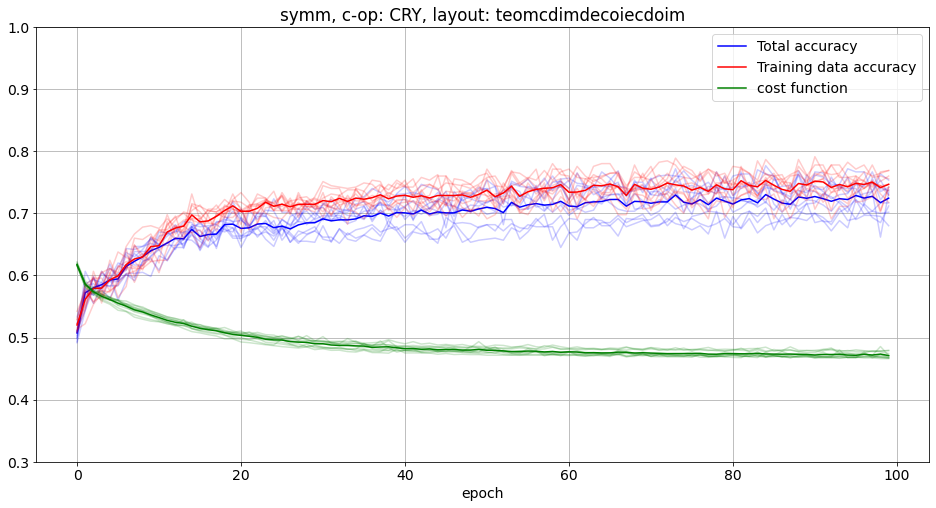

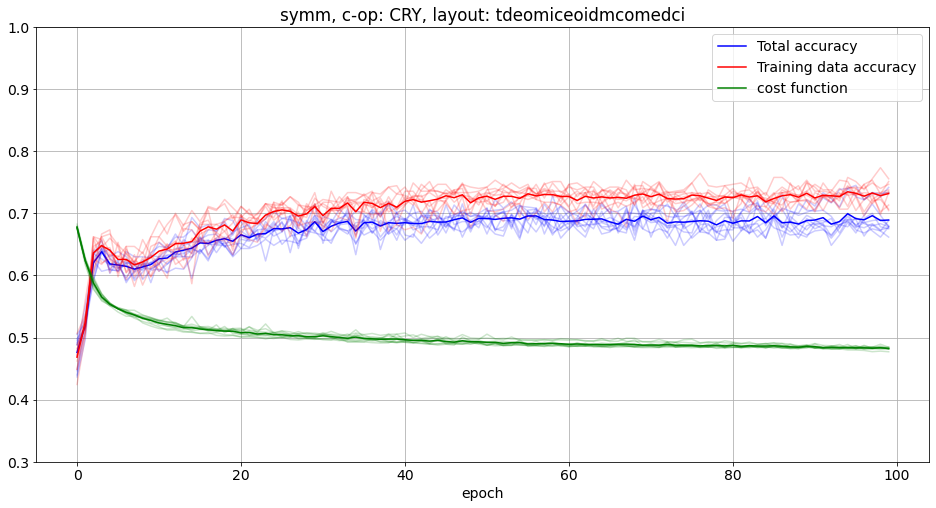

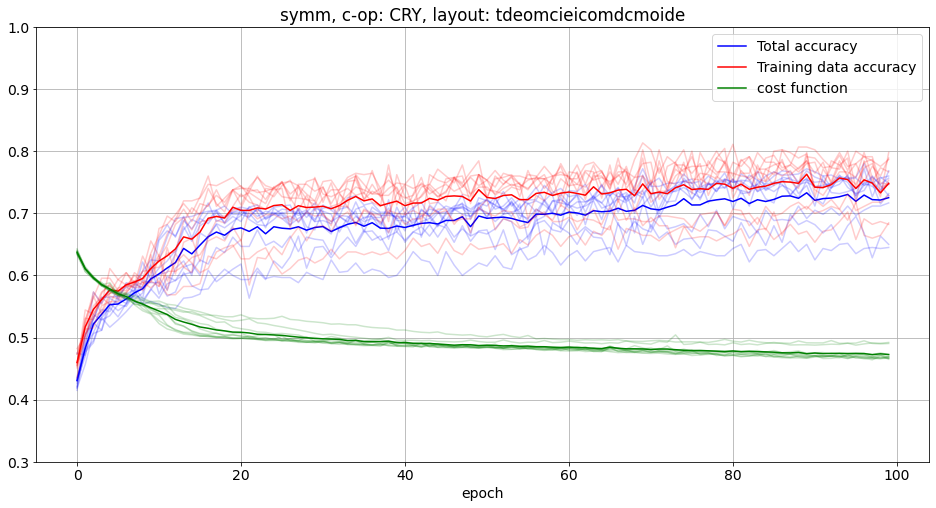

In [28]:
for marker in range(4000,4020):
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    symmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
    
    args = params.split(" ")
    layout = args[args.index('-l')+1]
    
    plt.figure(figsize=(16, 8))

    epoch_acc = np.array([i['epoch total accuracy'] for i in symmetric])
    epoch_train_acc = np.array([i['epoch accuracy'] for i in symmetric])
    epoch_cost = (torch.tensor([i['epoch cost'] for i in symmetric])).detach().numpy()
    avg_epoch_acc = np.average(epoch_acc, axis=0)
    avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
    avg_epoch_cost = np.average(epoch_cost, axis=0)
    #plt.ylabel('accuracy')
    plt.xlabel('epoch')
    
    plt.plot([i.trace()/3 for i in avg_epoch_acc], label='Total accuracy',color='blue')
    for j in epoch_acc:
        plt.plot([i.trace()/3 for i in j], color='blue',alpha=0.2)
    
    plt.plot([i.trace()/3 for i in avg_epoch_train_acc], label='Training data accuracy',color='red')
    for j in epoch_train_acc:
        plt.plot([i.trace()/3 for i in j], color='red',alpha=0.2)
        
    plt.plot(avg_epoch_cost, label='cost function',color='green')
    for i in symmetric:
        plt.plot((torch.tensor(i['epoch cost'])).detach().numpy(), color='green',alpha=0.2)
    
    ax = plt.gca()
    ax.set_ylim([0.3, 1])
    
    #plt.title('symm\n'+params)
    plt.title('symm, c-op: CRY, layout: '+layout)
    plt.legend()
    plt.grid()
    plt.savefig(base_path+'/figs/symm_'+str(marker))
    

## Non symmetric case

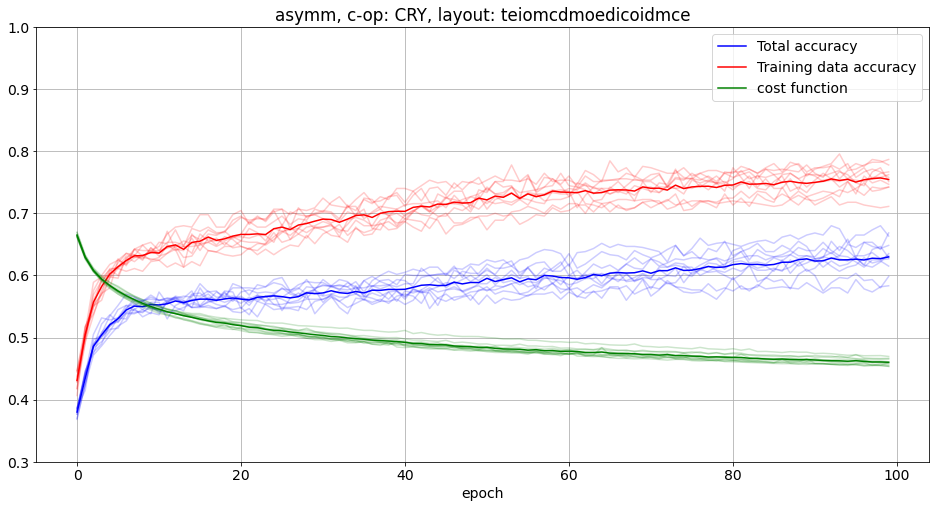

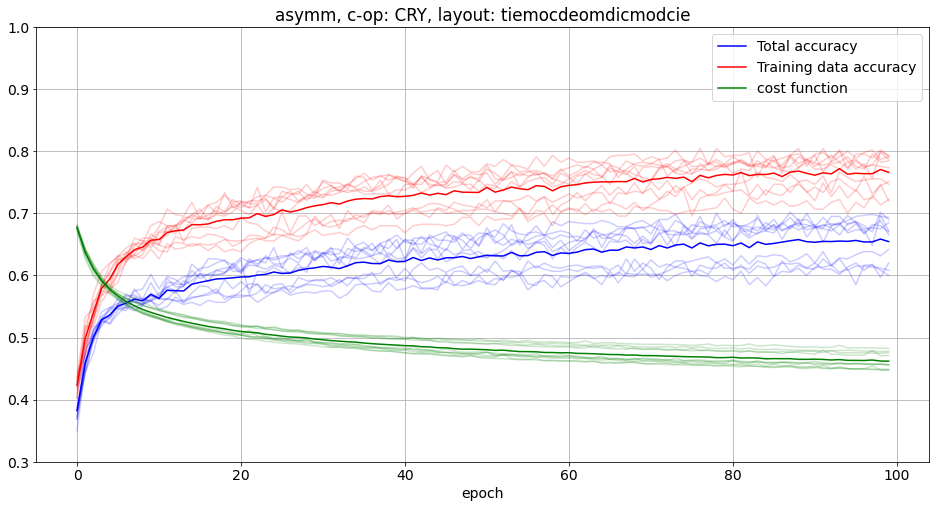

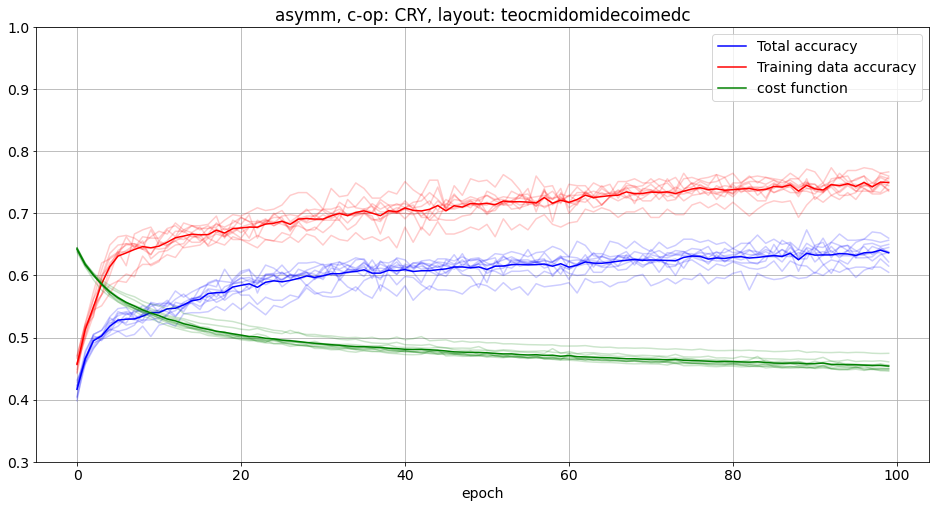

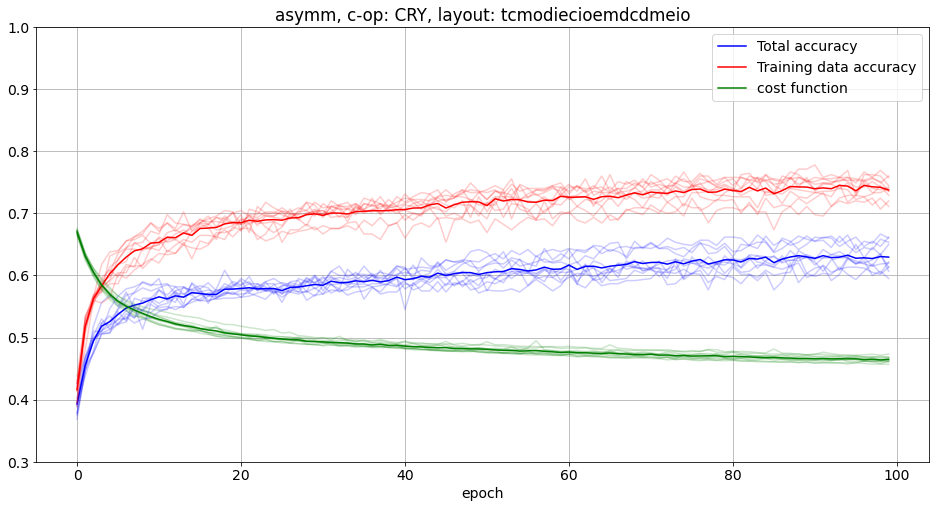

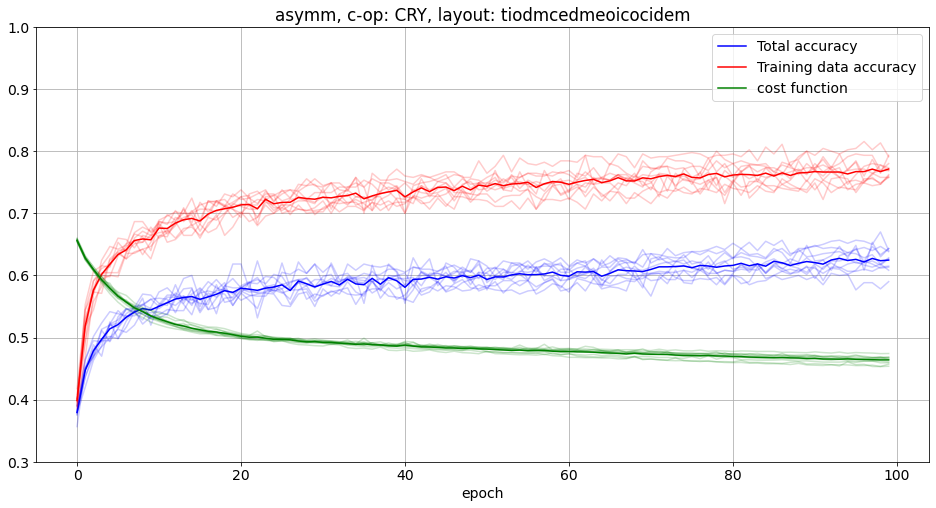

...

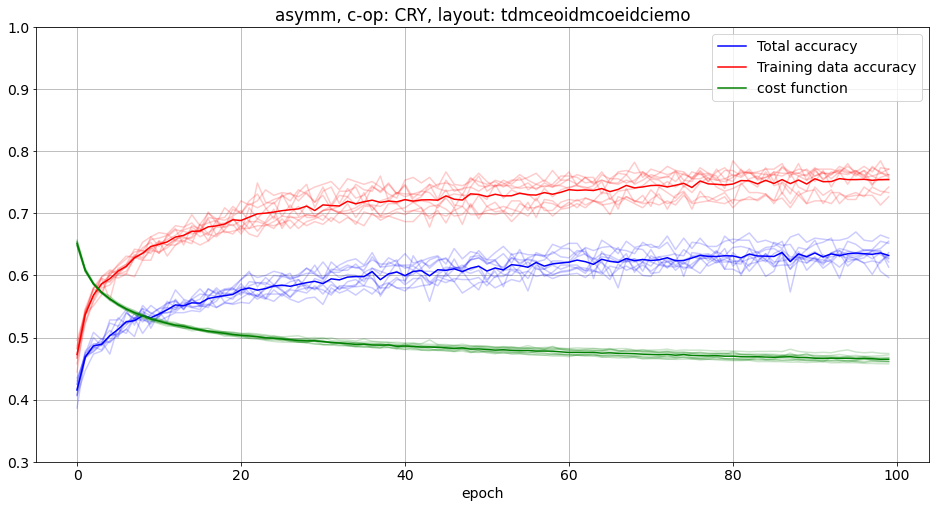

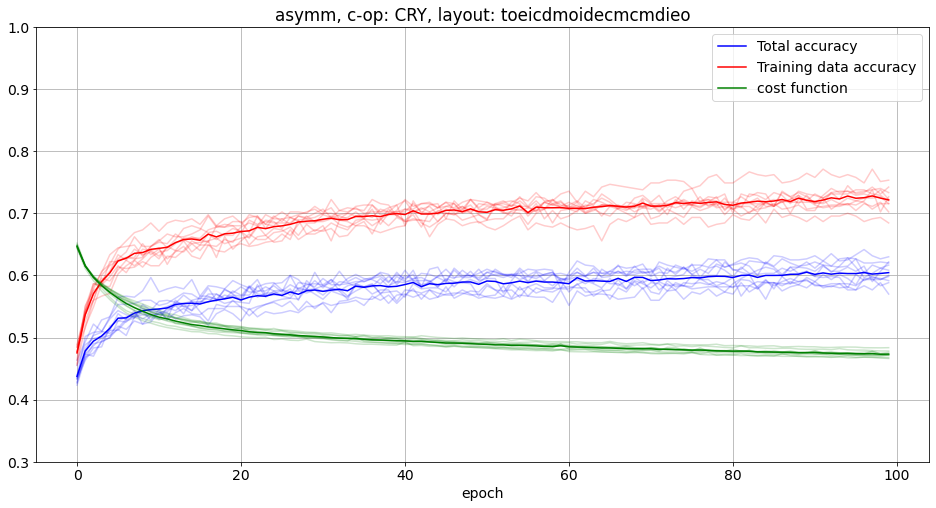

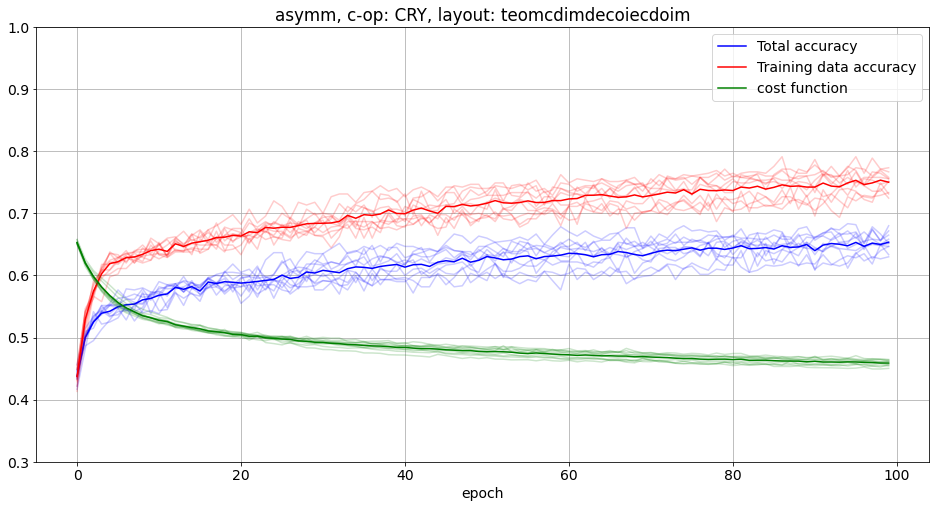

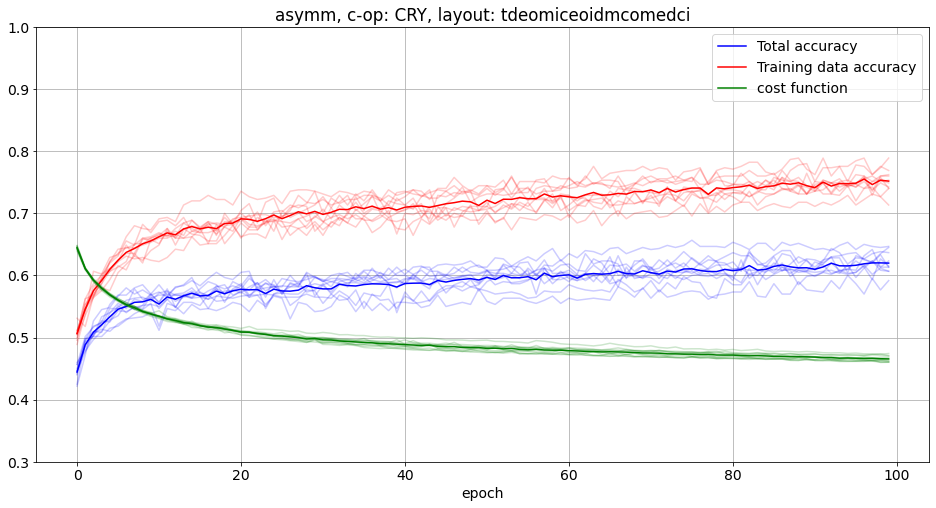

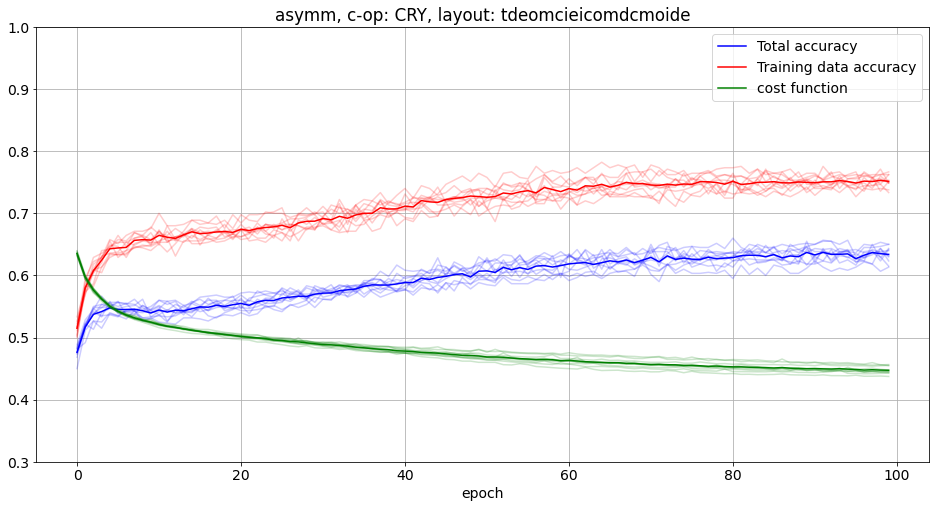

In [29]:
for marker in range(5000,5020):
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    asymmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    #filenames = next(os.walk(path_to_analyze), (None, None, []))[2]
    #symmetric = [np.load(path_to_analyze + '/' + i, allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    with open(base_path+str(marker)+'/params.txt') as f:
        params = f.readlines()[0]
    
    args = params.split(" ")
    layout = args[args.index('-l')+1]
    
    plt.figure(figsize=(16, 8))

    epoch_acc = np.array([i['epoch total accuracy'] for i in asymmetric])
    epoch_train_acc = np.array([i['epoch accuracy'] for i in asymmetric])
    epoch_cost = (torch.tensor([i['epoch cost'] for i in asymmetric])).detach().numpy()
    
    avg_epoch_acc = np.average(epoch_acc, axis=0)
    avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
    avg_epoch_cost = np.average(epoch_cost, axis=0)
    #plt.ylabel('accuracy')
    plt.xlabel('epoch')
    
    plt.plot([i.trace()/3 for i in avg_epoch_acc], label='Total accuracy',color='blue')
    for j in epoch_acc:
        plt.plot([i.trace()/3 for i in j], color='blue',alpha=0.2)
    
    plt.plot([i.trace()/3 for i in avg_epoch_train_acc], label='Training data accuracy',color='red')
    for j in epoch_train_acc:
        plt.plot([i.trace()/3 for i in j], color='red',alpha=0.2)
        
    plt.plot(avg_epoch_cost, label='cost function',color='green')
    for j in epoch_cost:
        plt.plot(j[:], color='green',alpha=0.2)
        #plt.plot((torch.tensor(i['epoch cost'])).detach().numpy(), color='green',alpha=0.2)
    
    ax = plt.gca()
    ax.set_ylim([0.3, 1])
    
    #plt.title('symm\n'+params)
    plt.title('asymm, c-op: CRY, layout: '+layout)
    plt.legend()
    plt.grid()
    plt.savefig(base_path+'/figs/asymm_'+str(marker))
    

### Histogram of accuracy deltas for random layouts

In [5]:
symm_final_acc = []
symm_final_train_acc = []
symm_final_cost = []
for marker in range(4000,4020):
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    symmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    epoch_acc = np.array([i['epoch total accuracy'][-1] for i in symmetric])
    epoch_train_acc = np.array([i['epoch accuracy'][-1] for i in symmetric])
    epoch_cost = (torch.tensor([i['epoch cost'][-1] for i in symmetric])).detach().numpy()
    avg_epoch_acc = np.average(epoch_acc, axis=0)
    avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
    avg_epoch_cost = np.average(epoch_cost, axis=0)
    
    symm_final_acc.append(avg_epoch_acc.trace()/3)
    symm_final_train_acc.append(avg_epoch_train_acc.trace()/3)
    symm_final_cost.append(avg_epoch_cost)

In [6]:
asymm_final_acc = []
asymm_final_train_acc = []
asymm_final_cost = []
for marker in range(5000,5020):
    filenames = next(os.walk(base_path+str(marker)), (None, None, []))[2]
    asymmetric = [np.load(base_path + str(marker) + '/' + str(i), allow_pickle=True).item() for i in filenames if i != 'params.txt']
    
    epoch_acc = np.array([i['epoch total accuracy'][-1] for i in asymmetric])
    epoch_train_acc = np.array([i['epoch accuracy'][-1] for i in asymmetric])
    epoch_cost = (torch.tensor([i['epoch cost'][-1] for i in asymmetric])).detach().numpy()
    avg_epoch_acc = np.average(epoch_acc, axis=0)
    avg_epoch_train_acc = np.average(epoch_train_acc, axis=0)
    avg_epoch_cost = np.average(epoch_cost, axis=0)
    
    asymm_final_acc.append(avg_epoch_acc.trace()/3)
    asymm_final_train_acc.append(avg_epoch_train_acc.trace()/3)
    asymm_final_cost.append(avg_epoch_cost)

In [7]:
d_final_acc = np.array(symm_final_acc) - np.array(asymm_final_acc)
d_final_train_acc = np.array(symm_final_train_acc) - np.array(asymm_final_train_acc)
d_final_cost = np.array(symm_final_cost) - np.array(asymm_final_cost)

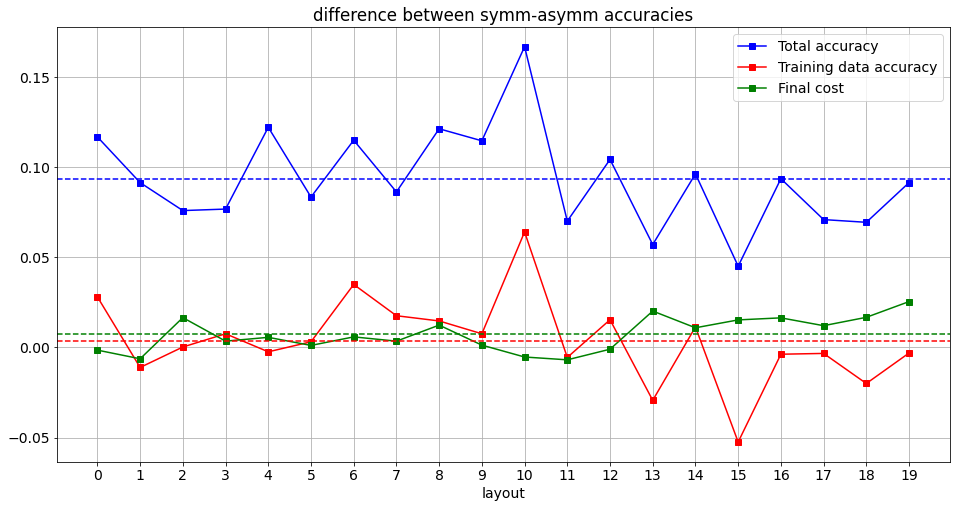

In [9]:
plt.figure(figsize=(16, 8))
ax = plt.gca()

plt.plot(d_final_acc, label='Total accuracy',color='blue',marker='s')
plt.plot(d_final_train_acc, label='Training data accuracy',color='red',marker='s')
plt.plot(d_final_cost, label='Final cost',color='green',marker='s')

plt.axhline(y=np.average(d_final_acc), color='blue', linestyle='--')
plt.axhline(y=np.average(d_final_train_acc), color='red', linestyle='--')
plt.axhline(y=np.average(d_final_cost), color='green', linestyle='--')

plt.xlabel('layout')
#ax.set_ylim([0.3, 1.2])

plt.xticks(np.arange(0, 20, step=1))

plt.title('difference between symm-asymm accuracies')
plt.legend()
plt.grid(axis='both')
plt.savefig(base_path+'/figs/rand_layout_deltas')
plt.show()


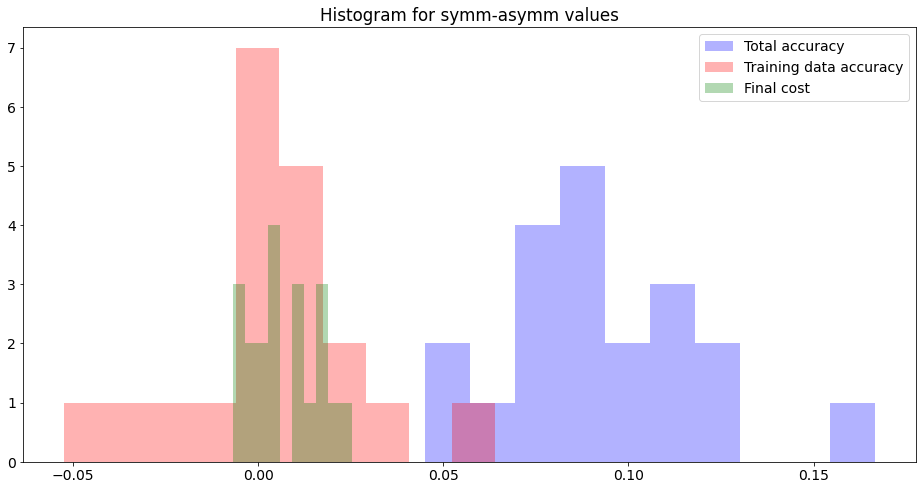

In [10]:
plt.figure(figsize=(16, 8))
plt.hist(d_final_acc,color='blue', label='Total accuracy',alpha=0.3)
plt.hist(d_final_train_acc,color='red', label='Training data accuracy',alpha=0.3)
plt.hist(d_final_cost,color='green', label='Final cost',alpha=0.3)

plt.title('Histogram for symm-asymm values')
plt.legend()
plt.savefig(base_path+'/figs/rand_layout_deltas_hist')
plt.show()


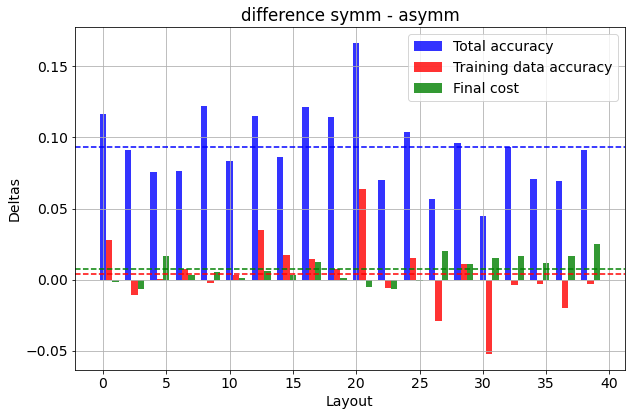

In [11]:
# data to plot
n_groups = len(d_final_acc)
#means_frank = (90, 55, 40, 65)
#means_guido = (85, 62, 54, 20)

'''
plt.plot(d_final_acc, label='Total accuracy',color='blue',marker='s')
plt.plot(d_final_train_acc, label='Training data accuracy',color='red',marker='s')
plt.plot(d_final_cost, label='Final cost',color='green',marker='s')

plt.axhline(y=np.average(d_final_acc), color='blue', linestyle='--')
plt.axhline(y=np.average(d_final_train_acc), color='red', linestyle='--')
plt.axhline(y=np.average(d_final_cost), color='green', linestyle='--')
'''
# create plot


fig, ax = plt.subplots(figsize=(9,6))




bar_width = 0.5
index = 2*np.arange(n_groups)
opacity = 0.8

rects1 = plt.bar(index, d_final_acc, bar_width,
alpha=opacity,
color='blue',
label='Total accuracy')


rects2 = plt.bar(index + bar_width, d_final_train_acc, bar_width,
alpha=opacity,
color='red',
label='Training data accuracy')

rects3 = plt.bar(index + 2*bar_width, d_final_cost, bar_width,
alpha=opacity,
color='green',
label='Final cost')


plt.axhline(y=np.average(d_final_acc), color='blue', linestyle='--')
plt.axhline(y=np.average(d_final_train_acc), color='red', linestyle='--')
plt.axhline(y=np.average(d_final_cost), color='green', linestyle='--')


plt.xlabel('Layout')
plt.ylabel('Deltas')
plt.title('difference symm - asymm')
plt.grid()
#plt.xticks(index + bar_width, ('A', 'B', 'C', 'D'))
plt.legend()

plt.tight_layout()
plt.savefig(base_path+'/figs/rand_layout_deltas_barchart')
plt.show()

